In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, 
                                   scanlevel=False, tijmen=False, sybil=False)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    # "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

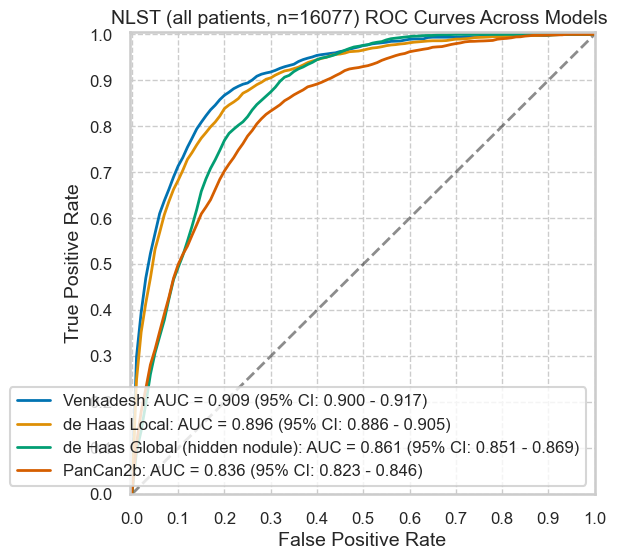

In [6]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [7]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL, min_mal=10)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("Not binary: not computing significance test results.")

### Included columns (from predictions)

#### Spiculation

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:309: RuntimeWarning: invalid value encountered in sqrt
  se = np.sqrt(


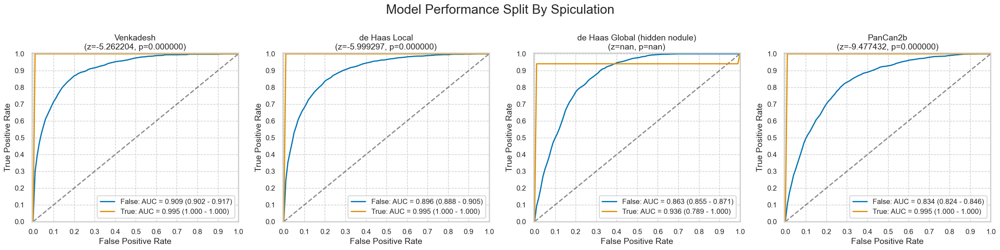

,num,pct,num_mal,pct_mal
False,16057,99.875599,1230,7.660211
True,20,0.124401,19,95.000000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-5.262204e+00,-5.999297e+00,NaN,-9.477432e+00
p,1.423384e-07,1.981733e-09,NaN,2.606176e-21


#### NoduleInUpperLung

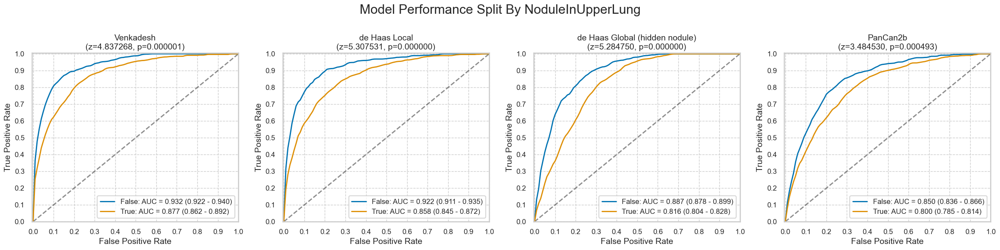

,num,pct,num_mal,pct_mal
False,9331,58.039435,483,5.176294
True,6746,41.960565,766,11.354877


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,4.837268,5.307531e+00,5.284750e+00,3.484530
p,0.000001,1.111202e-07,1.258764e-07,0.000493


#### Solid

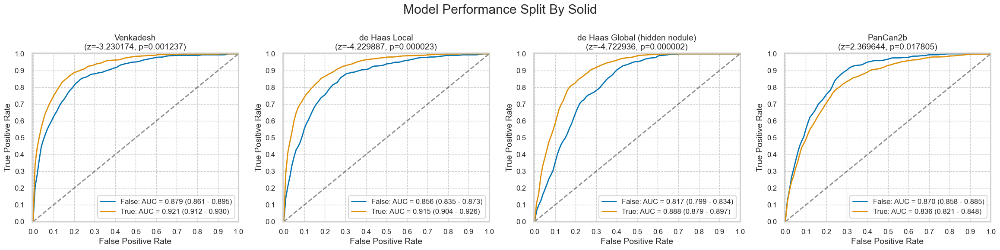

,num,pct,num_mal,pct_mal
False,6391,39.752441,371,5.805038
True,9686,60.247559,878,9.064629


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-3.230174,-4.229887,-4.722936,2.369644
p,0.001237,0.000023,0.000002,0.017805


#### GroundGlassOpacity

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,12466,77.539342,1249,10.019252
True,3611,22.460658,0,0.000000


Not binary: not computing significance test results.


#### Perifissural

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,15148,94.221559,1249,8.245313
True,929,5.778441,0,0.000000


Not binary: not computing significance test results.


#### NonSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,15951,99.216272,1123,7.040311
True,126,0.783728,126,100.000000


Not binary: not computing significance test results.


#### PartSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,15832,98.476084,1004,6.341587
True,245,1.523916,245,100.000000


Not binary: not computing significance test results.


#### SemiSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,14605,90.844063,1249,8.551866
True,1472,9.155937,0,0.000000


Not binary: not computing significance test results.


#### Calcified

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,16069,99.950239,1249,7.77273
True,8,0.049761,0,0.00000


Not binary: not computing significance test results.


In [8]:
for c in nlst_democols['cat']['nodule']:
    plot_by_category(nlst_preds, c)

#### wrknomask

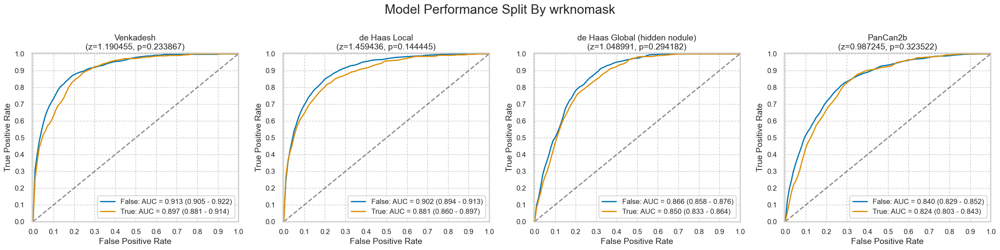

,num,pct,num_mal,pct_mal
False,12041,74.895814,943,7.831575
True,4036,25.104186,306,7.581764


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.190455,1.459436,1.048991,0.987245
p,0.233867,0.144445,0.294182,0.323522


#### FamilyHistoryLungCa

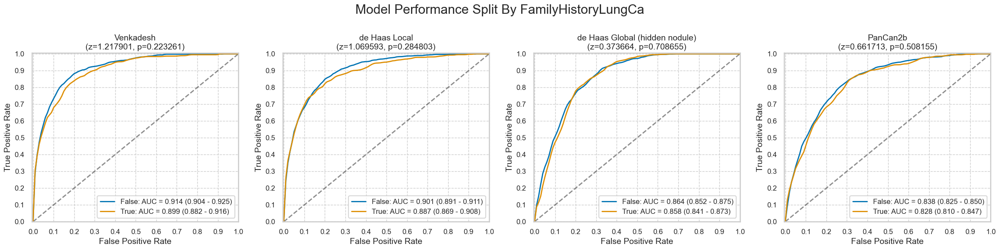

,num,pct,num_mal,pct_mal
False,11979,74.51017,870,7.262710
True,4098,25.48983,379,9.248414


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.217901,1.069593,0.373664,0.661713
p,0.223261,0.284803,0.708655,0.508155


#### PersonalCancerHist

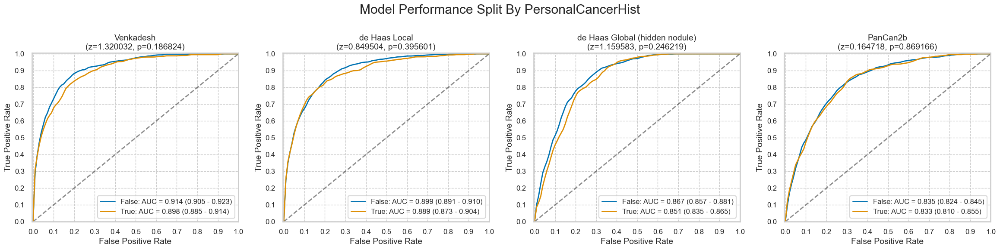

,num,pct,num_mal,pct_mal
False,11480,71.406357,814,7.090592
True,4597,28.593643,435,9.462693


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.320032,0.849504,1.159583,0.164718
p,0.186824,0.395601,0.246219,0.869166


#### Emphysema

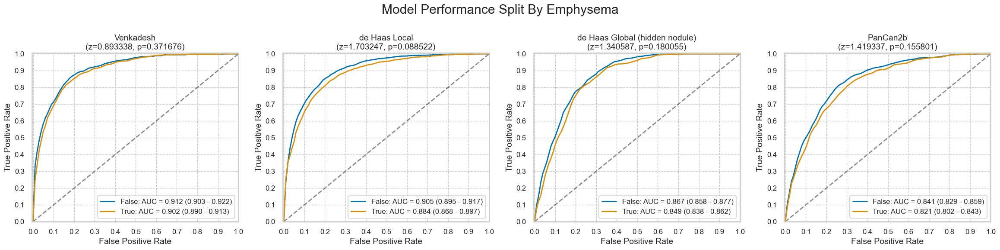

,num,pct,num_mal,pct_mal
False,10385,64.595385,697,6.711603
True,5692,35.404615,552,9.697822


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.893338,1.703247,1.340587,1.419337
p,0.371676,0.088522,0.180055,0.155801


In [9]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Demographics

#### marital

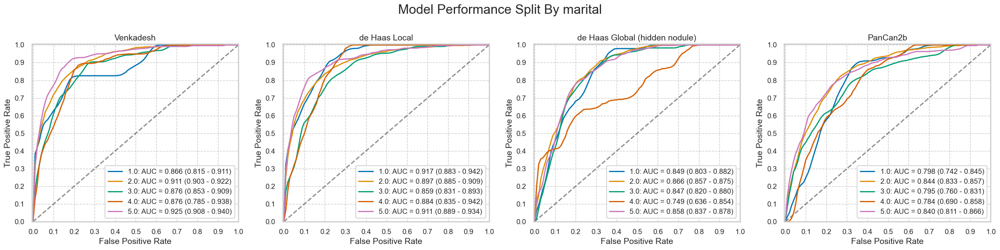

,num,pct,num_mal,pct_mal
1.0,644,4.016966,48,7.453416
2.0,10898,67.976547,796,7.304092
3.0,1327,8.277196,127,9.570460
4.0,206,1.284930,17,8.252427
5.0,2957,18.444361,259,8.758877


Not binary: not computing significance test results.


#### educat

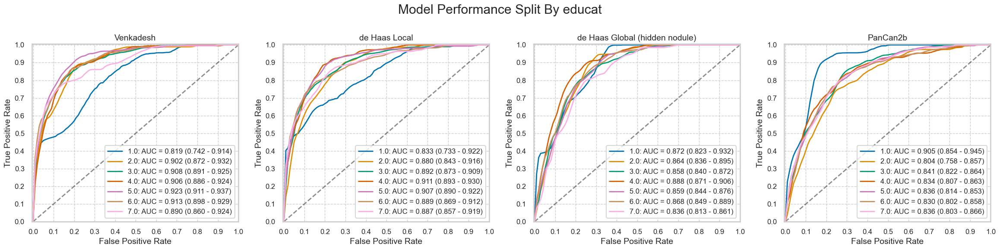

,num,pct,num_mal,pct_mal
1.0,268,1.696739,24,8.955224
2.0,872,5.520734,74,8.486239
3.0,4077,25.811966,311,7.628158
4.0,2307,14.605888,176,7.628955
5.0,3539,22.405825,304,8.589997
6.0,2493,15.783476,187,7.501003
7.0,2239,14.175372,145,6.476105


Not binary: not computing significance test results.


#### race

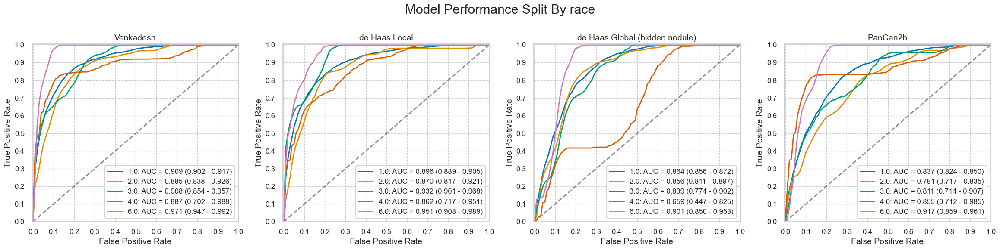

,num,pct,num_mal,pct_mal
1.0,15040,93.777279,1145,7.613032
2.0,481,2.999127,57,11.850312
3.0,228,1.421624,21,9.210526
4.0,68,0.423993,12,17.647059
5.0,44,0.274348,2,4.545455
6.0,177,1.103629,10,5.649718


Not binary: not computing significance test results.


#### ethnic

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
1.0,210,1.313403,9,4.285714
2.0,15779,98.686597,1230,7.795171


Not binary: not computing significance test results.


#### Gender

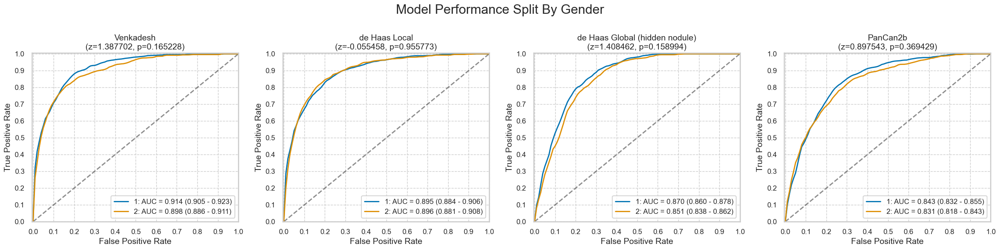

,num,pct,num_mal,pct_mal
1,9281,57.728432,727,7.833208
2,6796,42.271568,522,7.680989


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.387702,-0.055458,1.408462,0.897543
p,0.165228,0.955773,0.158994,0.369429


#### Married

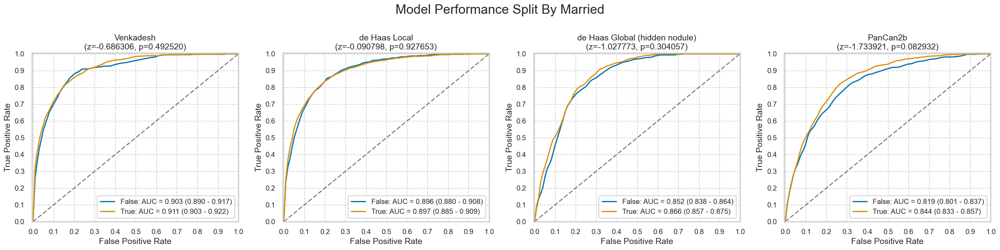

,num,pct,num_mal,pct_mal
False,5179,32.213721,453,8.746862
True,10898,67.786279,796,7.304092


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.686306,-0.090798,-1.027773,-1.733921
p,0.492520,0.927653,0.304057,0.082932


#### NonHispanicWhite

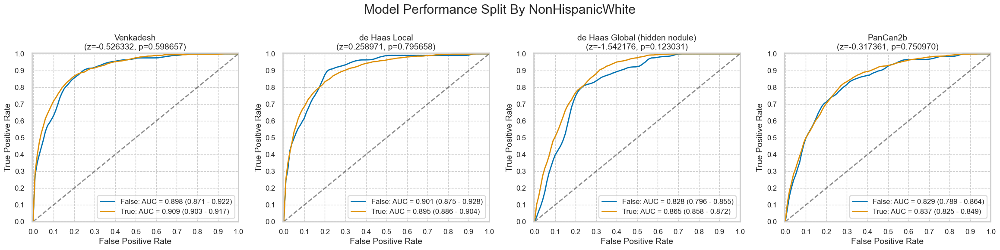

,num,pct,num_mal,pct_mal
False,1259,7.831063,118,9.372518
True,14818,92.168937,1131,7.632609


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.526332,0.258971,-1.542176,-0.317361
p,0.598657,0.795658,0.123031,0.750970


#### HighSchoolPlus

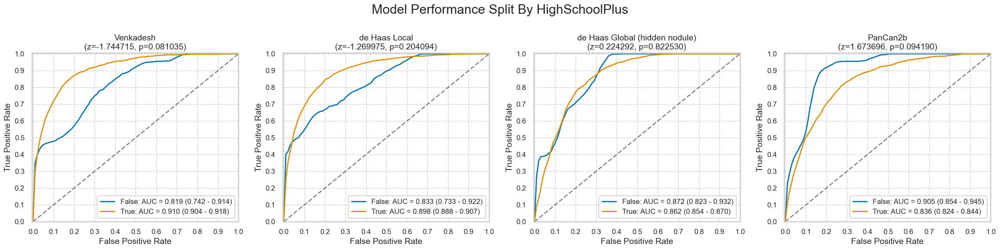

,num,pct,num_mal,pct_mal
False,268,1.666978,24,8.955224
True,15809,98.333022,1225,7.748751


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-1.744715,-1.269975,0.224292,1.673696
p,0.081035,0.204094,0.822530,0.094190


In [10]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

#### cigar

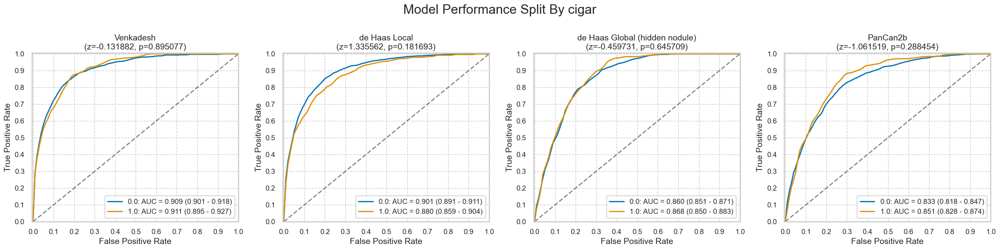

,num,pct,num_mal,pct_mal
0.0,13031,81.306545,1005,7.712378
1.0,2996,18.693455,240,8.010681


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.131882,1.335562,-0.459731,-1.061519
p,0.895077,0.181693,0.645709,0.288454


#### cigsmok

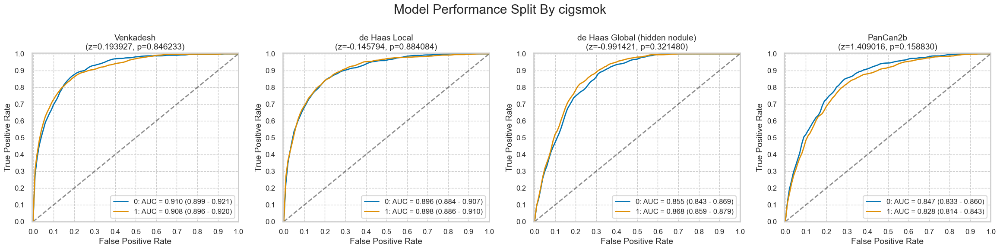

,num,pct,num_mal,pct_mal
0,7911,49.206942,575,7.268361
1,8166,50.793058,674,8.253735


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.193927,-0.145794,-0.991421,1.409016
p,0.846233,0.884084,0.321480,0.158830


#### pipe

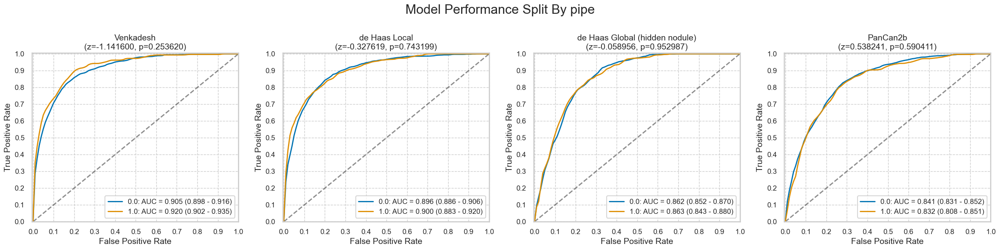

,num,pct,num_mal,pct_mal
0.0,12542,78.485607,948,7.558603
1.0,3438,21.514393,297,8.638743


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-1.14160,-0.327619,-0.058956,0.538241
p,0.25362,0.743199,0.952987,0.590411


#### smokelive

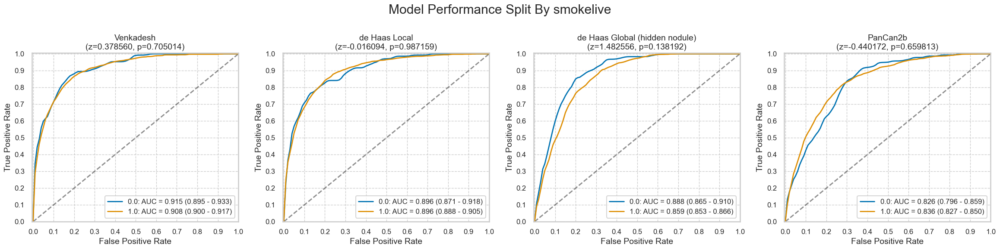

,num,pct,num_mal,pct_mal
0.0,1870,11.678741,133,7.112299
1.0,14142,88.321259,1110,7.848961


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.378560,-0.016094,1.482556,-0.440172
p,0.705014,0.987159,0.138192,0.659813


#### smokework

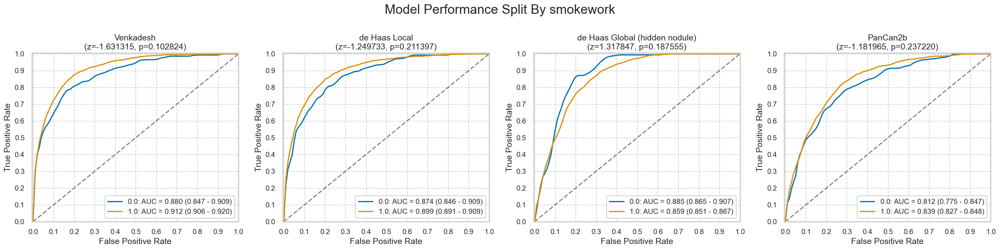

,num,pct,num_mal,pct_mal
0.0,2041,12.784215,142,6.957374
1.0,13924,87.215785,1095,7.864120


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-1.631315,-1.249733,1.317847,-1.181965
p,0.102824,0.211397,0.187555,0.237220


In [11]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

#### wrkasbe

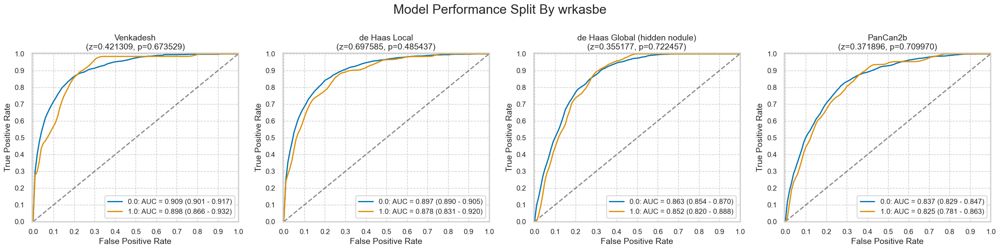

,num,pct,num_mal,pct_mal
0.0,15277,95.089008,1182,7.737121
1.0,789,4.910992,66,8.365019


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.421309,0.697585,0.355177,0.371896
p,0.673529,0.485437,0.722457,0.709970


#### wrkbaki

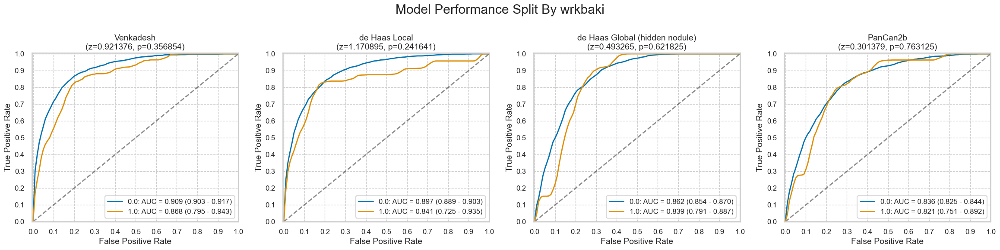

,num,pct,num_mal,pct_mal
0.0,15644,97.312764,1221,7.804909
1.0,432,2.687236,27,6.250000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.921376,1.170895,0.493265,0.301379
p,0.356854,0.241641,0.621825,0.763125


#### wrkbutc

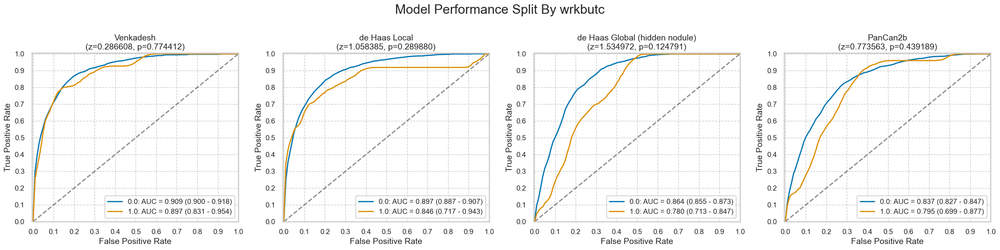

,num,pct,num_mal,pct_mal
0.0,15780,98.158746,1223,7.750317
1.0,296,1.841254,25,8.445946


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.286608,1.058385,1.534972,0.773563
p,0.774412,0.289880,0.124791,0.439189


#### wrkchem

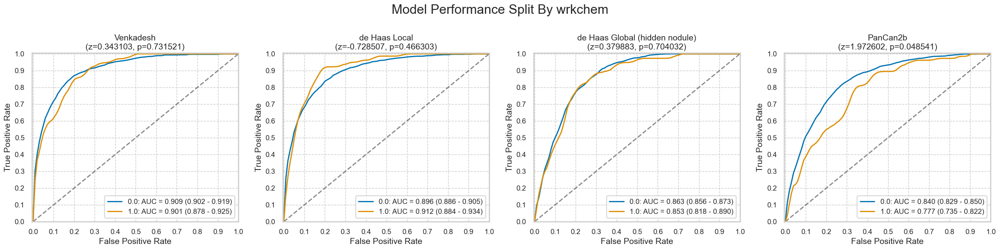

,num,pct,num_mal,pct_mal
0.0,15000,93.382307,1171,7.806667
1.0,1063,6.617693,77,7.243650


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.343103,-0.728507,0.379883,1.972602
p,0.731521,0.466303,0.704032,0.048541


#### wrkcoal

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,15994,99.489923,1241,7.759160
1.0,82,0.510077,7,8.536585


Not binary: not computing significance test results.


#### wrkcott

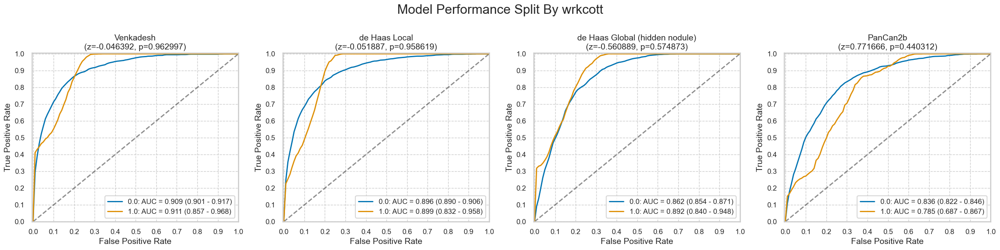

,num,pct,num_mal,pct_mal
0.0,15950,99.216223,1232,7.724138
1.0,126,0.783777,16,12.698413


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.046392,-0.051887,-0.560889,0.771666
p,0.962997,0.958619,0.574873,0.440312


#### wrkfarm

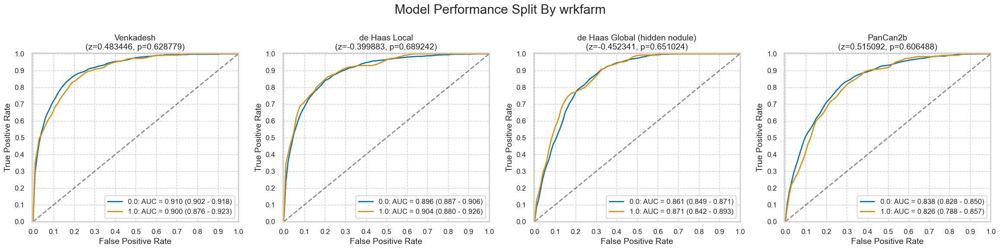

,num,pct,num_mal,pct_mal
0.0,14253,88.676663,1124,7.886059
1.0,1820,11.323337,121,6.648352


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.483446,-0.399883,-0.452341,0.515092
p,0.628779,0.689242,0.651024,0.606488


#### wrkfire

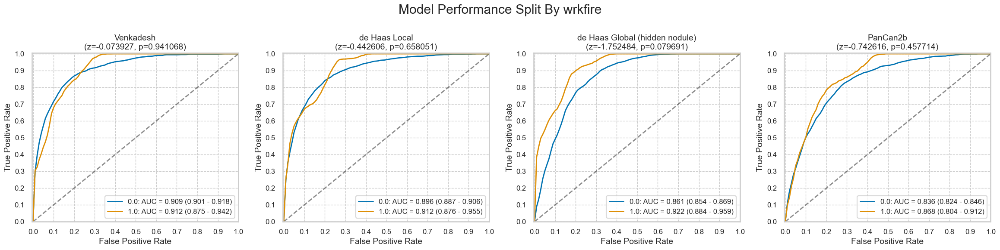

,num,pct,num_mal,pct_mal
0.0,15808,98.332919,1219,7.711285
1.0,268,1.667081,29,10.820896


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.073927,-0.442606,-1.752484,-0.742616
p,0.941068,0.658051,0.079691,0.457714


#### wrkflou

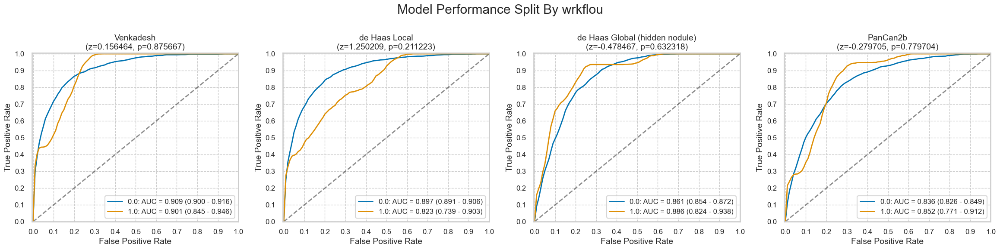

,num,pct,num_mal,pct_mal
0.0,15926,99.066932,1230,7.72322
1.0,150,0.933068,18,12.00000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.156464,1.250209,-0.478467,-0.279705
p,0.875667,0.211223,0.632318,0.779704


#### wrkfoun

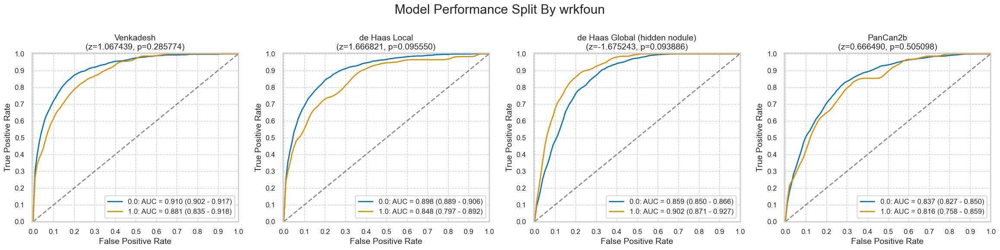

,num,pct,num_mal,pct_mal
0.0,15409,95.850958,1182,7.670842
1.0,667,4.149042,66,9.895052


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.067439,1.666821,-1.675243,0.666490
p,0.285774,0.095550,0.093886,0.505098


#### wrkhard

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,15957,99.259766,1245,7.802218
1.0,119,0.740234,3,2.521008


Not binary: not computing significance test results.


#### wrkpain

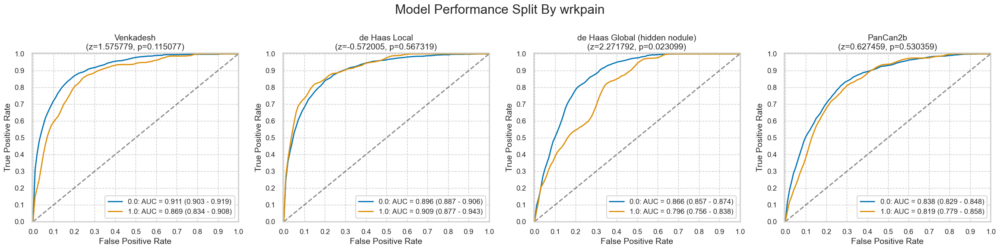

,num,pct,num_mal,pct_mal
0.0,15262,94.936551,1171,7.672651
1.0,814,5.063449,77,9.459459


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.575779,-0.572005,2.271792,0.627459
p,0.115077,0.567319,0.023099,0.530359


#### wrksand

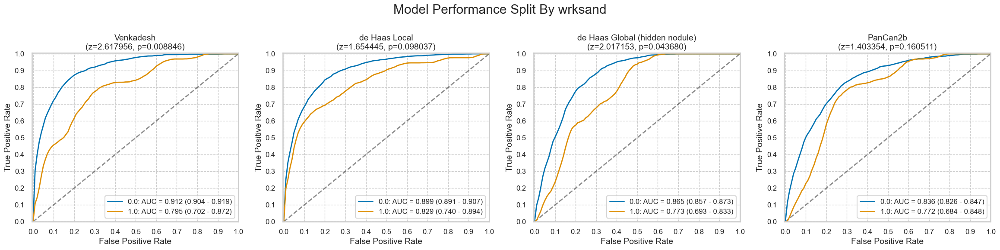

,num,pct,num_mal,pct_mal
0.0,15834,98.49465,1213,7.66073
1.0,242,1.50535,35,14.46281


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,2.617956,1.654445,2.017153,1.403354
p,0.008846,0.098037,0.043680,0.160511


#### wrkweld

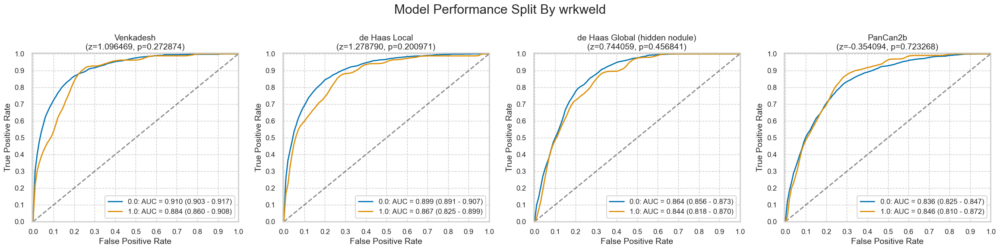

,num,pct,num_mal,pct_mal
0.0,15145,94.208758,1159,7.652691
1.0,931,5.791242,89,9.559613


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.096469,1.278790,0.744059,-0.354094
p,0.272874,0.200971,0.456841,0.723268


In [12]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

#### Emphysema

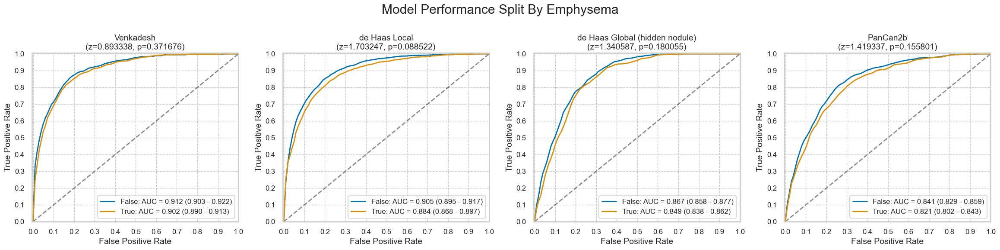

,num,pct,num_mal,pct_mal
False,10385,64.595385,697,6.711603
True,5692,35.404615,552,9.697822


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.893338,1.703247,1.340587,1.419337
p,0.371676,0.088522,0.180055,0.155801


In [13]:
plot_by_category(nlst_preds, 'Emphysema')

#### diagadas

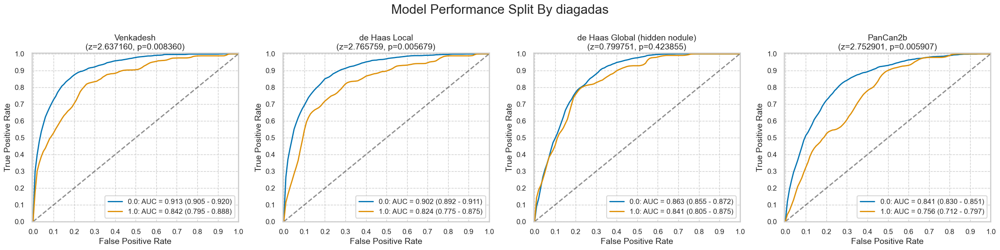

,num,pct,num_mal,pct_mal
0.0,15015,93.533919,1159,7.718948
1.0,1038,6.466081,85,8.188825


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,2.63716,2.765759,0.799751,2.752901
p,0.00836,0.005679,0.423855,0.005907


#### diagasbe

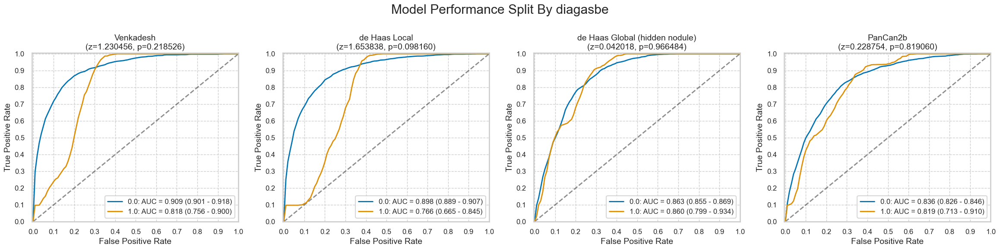

,num,pct,num_mal,pct_mal
0.0,15884,98.910268,1236,7.781415
1.0,175,1.089732,12,6.857143


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.230456,1.653838,0.042018,0.228754
p,0.218526,0.098160,0.966484,0.819060


#### diagbron

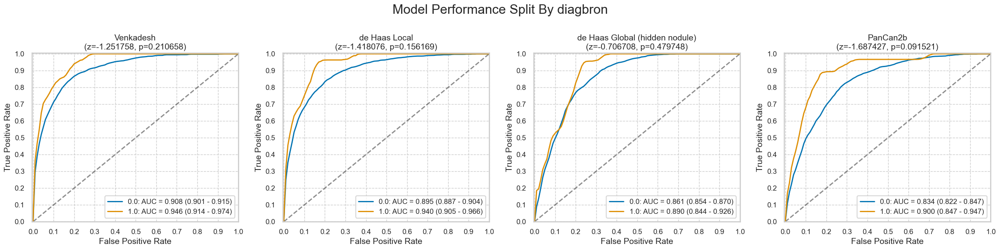

,num,pct,num_mal,pct_mal
0.0,15481,96.551079,1214,7.841871
1.0,553,3.448921,28,5.063291


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-1.251758,-1.418076,-0.706708,-1.687427
p,0.210658,0.156169,0.479748,0.091521


#### diagchas

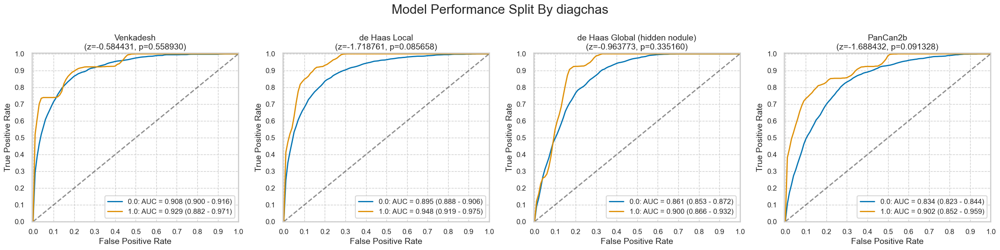

,num,pct,num_mal,pct_mal
0.0,15486,96.431907,1222,7.890998
1.0,573,3.568093,26,4.537522


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.584431,-1.718761,-0.963773,-1.688432
p,0.558930,0.085658,0.335160,0.091328


#### diagchro

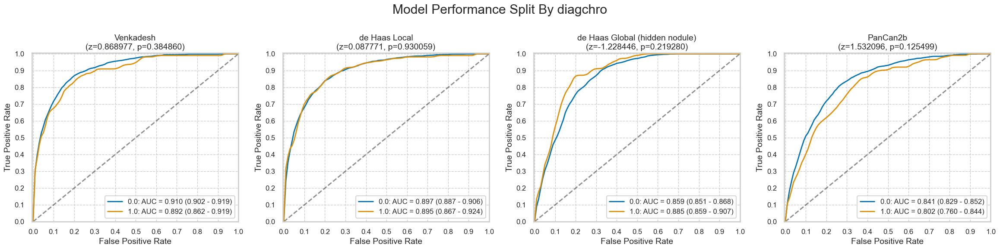

,num,pct,num_mal,pct_mal
0.0,14279,89.082288,1125,7.878703
1.0,1750,10.917712,116,6.628571


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.868977,0.087771,-1.228446,1.532096
p,0.384860,0.930059,0.219280,0.125499


#### diagcopd

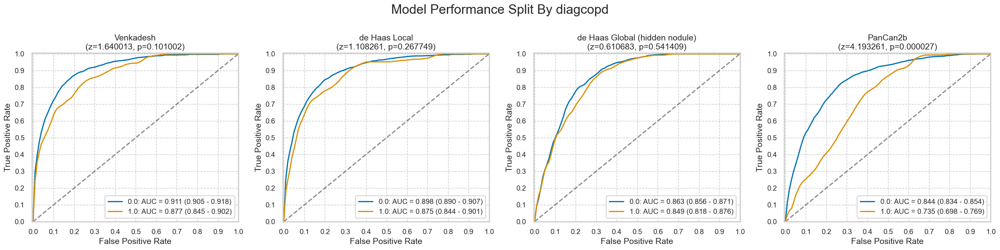

,num,pct,num_mal,pct_mal
0.0,14905,92.947119,1122,7.527675
1.0,1131,7.052881,124,10.963749


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.640013,1.108261,0.610683,4.193261
p,0.101002,0.267749,0.541409,0.000027


#### diagdiab

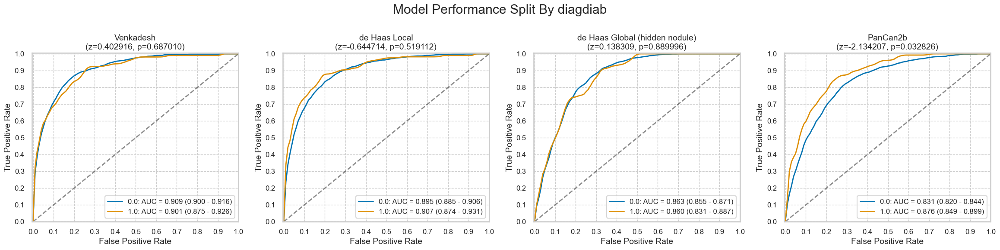

,num,pct,num_mal,pct_mal
0.0,14428,89.838107,1123,7.783477
1.0,1632,10.161893,125,7.659314


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.402916,-0.644714,0.138309,-2.134207
p,0.687010,0.519112,0.889996,0.032826


#### diagemph

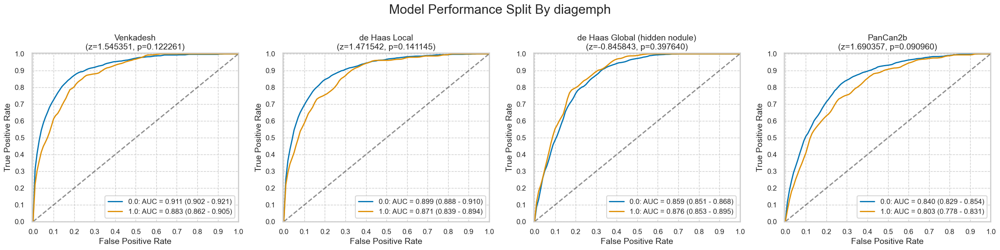

,num,pct,num_mal,pct_mal
0.0,14283,89.057239,1090,7.631450
1.0,1755,10.942761,156,8.888889


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.545351,1.471542,-0.845843,1.690357
p,0.122261,0.141145,0.397640,0.090960


#### diagfibr

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,16016,99.750872,1243,7.760989
1.0,40,0.249128,5,12.500000


Not binary: not computing significance test results.


#### diaghear

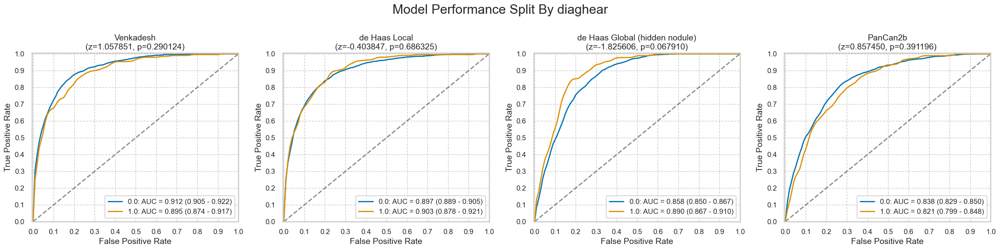

,num,pct,num_mal,pct_mal
0.0,13869,86.529823,1067,7.693417
1.0,2159,13.470177,179,8.290875


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.057851,-0.403847,-1.825606,0.857450
p,0.290124,0.686325,0.067910,0.391196


#### diaghype

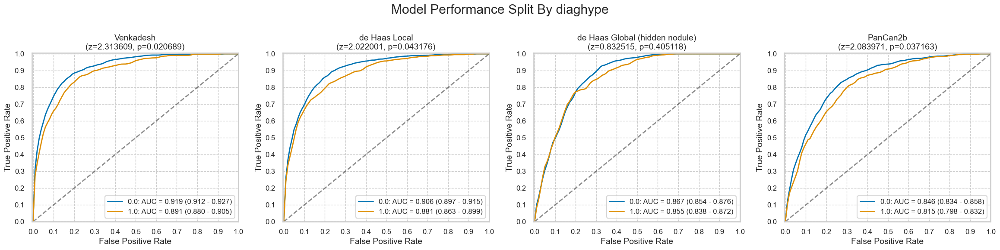

,num,pct,num_mal,pct_mal
0.0,10489,65.364243,798,7.607970
1.0,5558,34.635757,445,8.006477


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,2.313609,2.022001,0.832515,2.083971
p,0.020689,0.043176,0.405118,0.037163


#### diagpneu

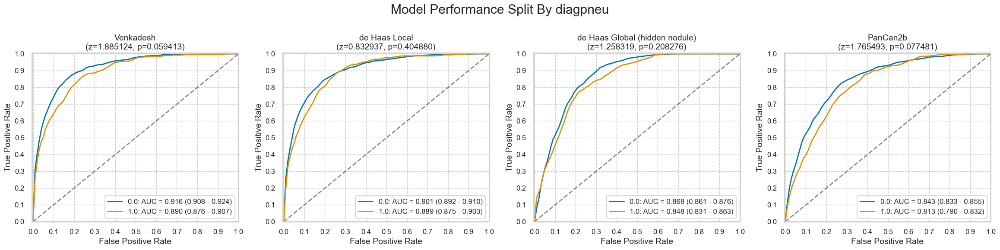

,num,pct,num_mal,pct_mal
0.0,12297,76.602504,946,7.692933
1.0,3756,23.397496,296,7.880724


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.885124,0.832937,1.258319,1.765493
p,0.059413,0.404880,0.208276,0.077481


#### diagsarc

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,16021,99.819315,1241,7.746083
1.0,29,0.180685,5,17.241379


Not binary: not computing significance test results.


#### diagsili

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,16030,99.875389,1242,7.747973
1.0,20,0.124611,4,20.000000


Not binary: not computing significance test results.


#### diagstro

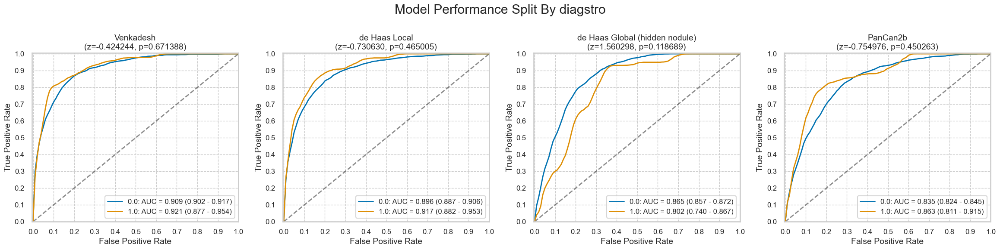

,num,pct,num_mal,pct_mal
0.0,15599,97.11742,1205,7.724854
1.0,463,2.88258,43,9.287257


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.424244,-0.730630,1.560298,-0.754976
p,0.671388,0.465005,0.118689,0.450263


#### diagtube

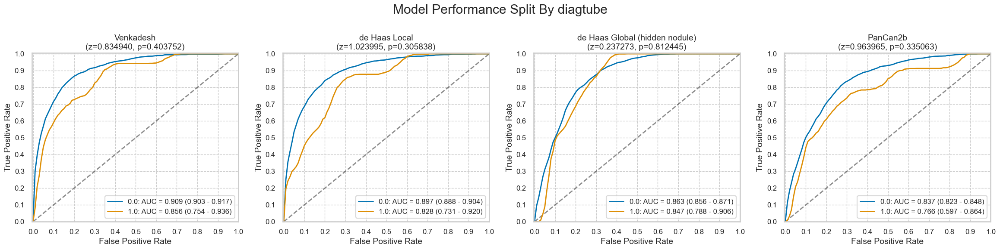

,num,pct,num_mal,pct_mal
0.0,15892,98.966247,1231,7.746036
1.0,166,1.033753,14,8.433735


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.834940,1.023995,0.237273,0.963965
p,0.403752,0.305838,0.812445,0.335063


In [14]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14808.0,67.978863,3.925579,53.0,65.0,68.0,71.0,83.0
1,1246.0,67.788925,3.950851,49.0,65.0,68.0,71.0,76.0


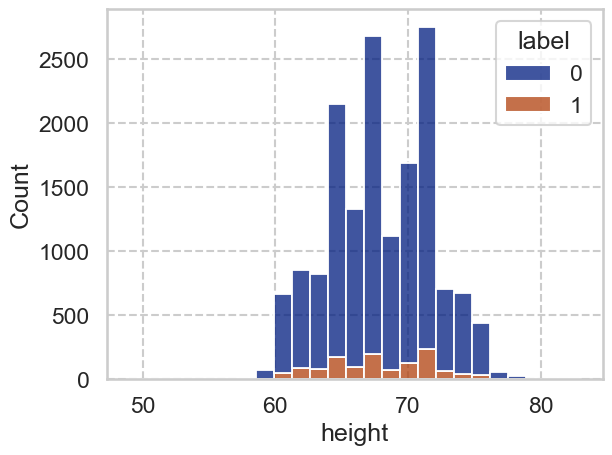

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14799.0,182.976552,39.067503,75.0,155.0,180.0,207.0,368.0
1,1243.0,175.740145,35.842933,95.0,150.0,174.0,200.0,322.0


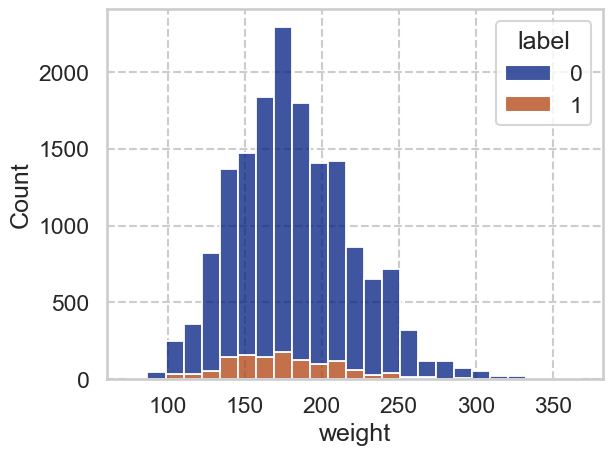

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,63.207850,5.254252,54.0,59.0,63.0,67.0,76.0
1,1249.0,64.240993,5.175638,55.0,60.0,64.0,68.0,76.0


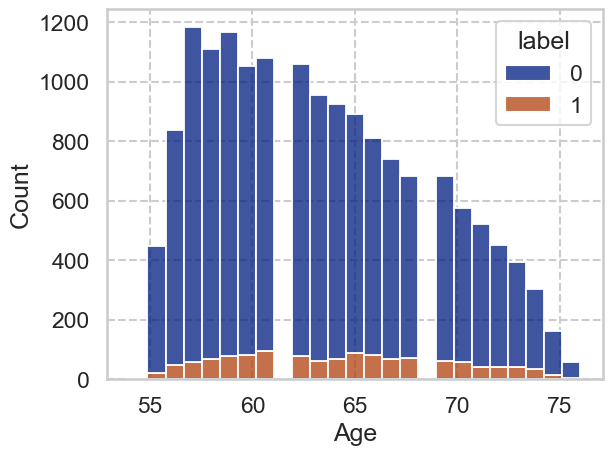

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14793.0,27.732211,4.992789,13.284203,24.293018,27.117676,30.550293,57.630653
1,1241.0,26.812351,4.692465,16.432432,24.102857,26.289704,29.022331,65.000416


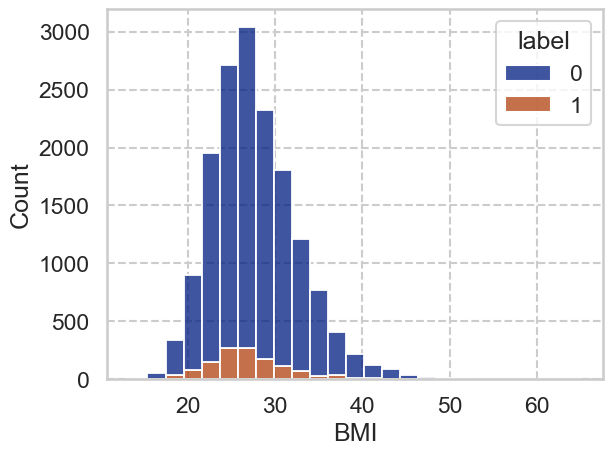

In [15]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\2493350604.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(53.999, 60.0]",5796.0,0.060559,0.238540,0.0,0.0,0.0,0.0,1.0
"(60.0, 66.0]",5719.0,0.082007,0.274400,0.0,0.0,0.0,0.0,1.0
"(66.0, 76.0]",4562.0,0.094038,0.291913,0.0,0.0,0.0,0.0,1.0


#### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


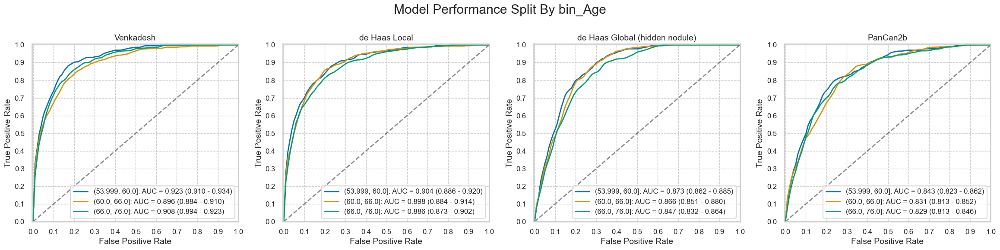

,num,pct,num_mal,pct_mal
"(53.999, 60.0]",5796,36.051502,351,6.055901
"(60.0, 66.0]",5719,35.572557,469,8.200734
"(66.0, 76.0]",4562,28.375941,429,9.403770


Not binary: not computing significance test results.


In [16]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=3)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')
nlst_preds = nlst_preds.drop(columns='bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\277020026.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    8587.0  0.079189  0.270050  0.0  0.0  0.0  0.0  1.0  8587.0   
(68, 88]    7467.0  0.075800  0.264696  0.0  0.0  0.0  0.0  1.0  7467.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.916385  2.371898  49.0  63.0  65.0  67.0  68.0  
(68, 88]    71.468997  1.931785  69.0  70.0  71.0  73.0  83.0

#### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


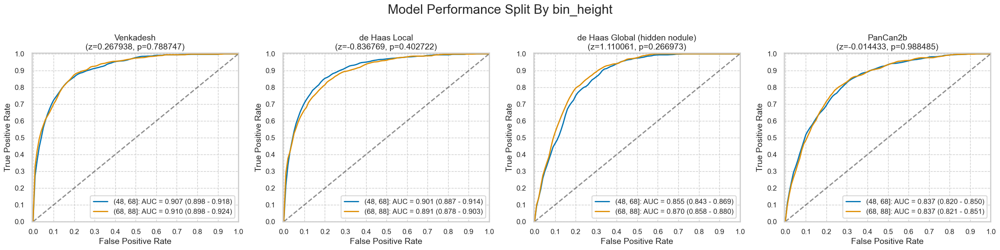

,num,pct,num_mal,pct_mal
"(48, 68]",8587,53.488227,680,7.918947
"(68, 88]",7467,46.511773,566,7.580019


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.267938,-0.836769,1.110061,-0.014433
p,0.788747,0.402722,0.266973,0.988485


In [17]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')
nlst_preds = nlst_preds.drop(columns='bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\890787443.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   7858.0  0.088063  0.283405  0.0  0.0  0.0  0.0  1.0  7858.0   
(179, 279]  7931.0  0.068592  0.252774  0.0  0.0  0.0  0.0  1.0  7931.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   151.196615  18.964525   88.0  140.0  155.0  166.0  179.0  
(179, 279]  209.704073  23.459800  180.0  190.0  205.0  225.0  279.0

#### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


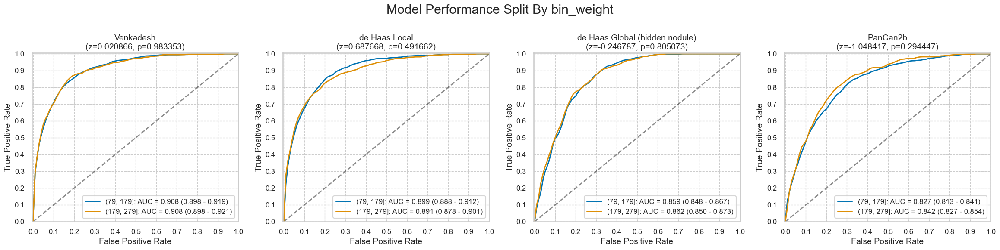

,num,pct,num_mal,pct_mal
"(79, 179]",7858,49.768826,692,8.806312
"(179, 279]",7931,50.231174,544,6.859160


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.020866,0.687668,-0.246787,-1.048417
p,0.983353,0.491662,0.805073,0.294447


In [18]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')
nlst_preds = nlst_preds.drop(columns='bin_weight')

### Smoking columns

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,57.575910,23.991348,30.0,40.0,50.0,68.0,260.0
1,1249.0,64.501841,27.541166,30.0,45.0,56.0,78.0,232.0


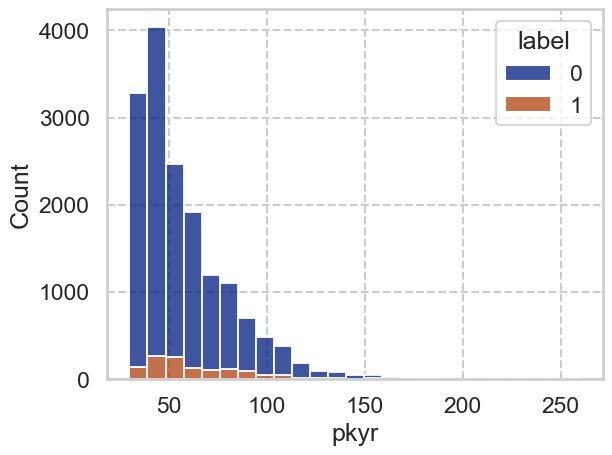

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,16.600958,3.496058,4.0,15.0,16.0,18.0,40.0
1,1249.0,16.223379,3.369913,6.0,14.0,16.0,18.0,33.0


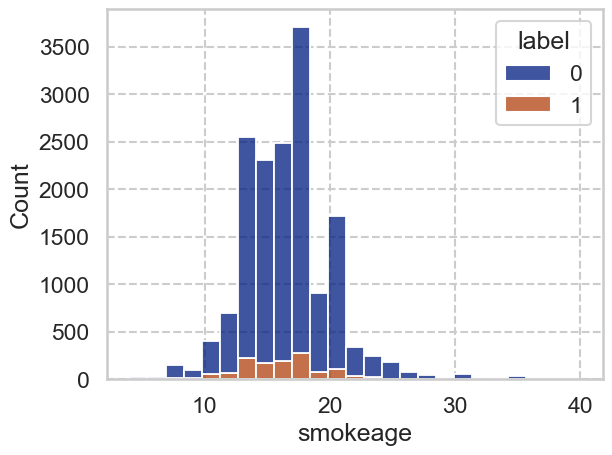

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,28.468843,11.351092,12.0,20.0,25.0,30.0,135.0
1,1249.0,29.903122,12.194579,15.0,20.0,30.0,40.0,100.0


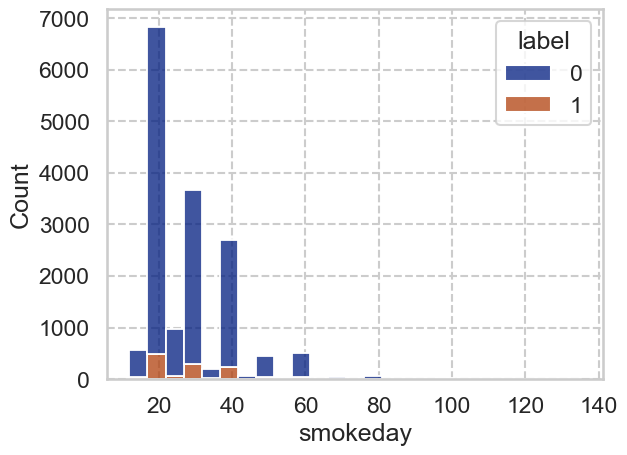

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,40.914621,7.379901,13.0,36.0,41.0,46.0,67.0
1,1249.0,43.640512,7.275904,15.0,39.0,44.0,49.0,65.0


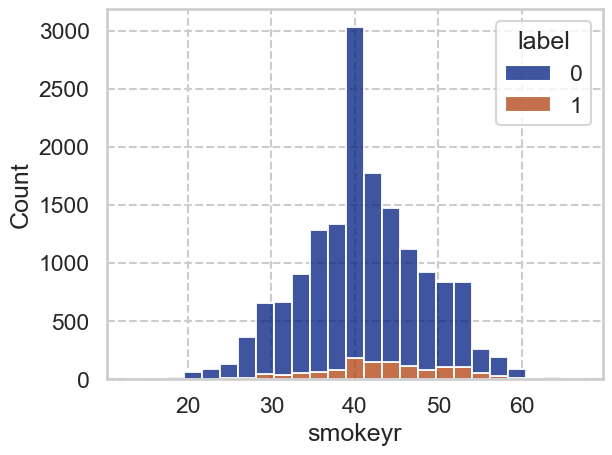

In [19]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3776529717.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  8211.0  0.061503  0.240265  0.0  0.0  0.0  0.0  1.0  8211.0   
(51.0, 260.0]   7866.0  0.094584  0.292658  0.0  0.0  0.0  0.0  1.0  7866.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.747022   5.740066  30.00  36.0  41.0  45.0   51.0  
(51.0, 260.0]   76.242639  23.119408  51.25  60.0  70.0  86.0  260.0

#### bin_pkyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


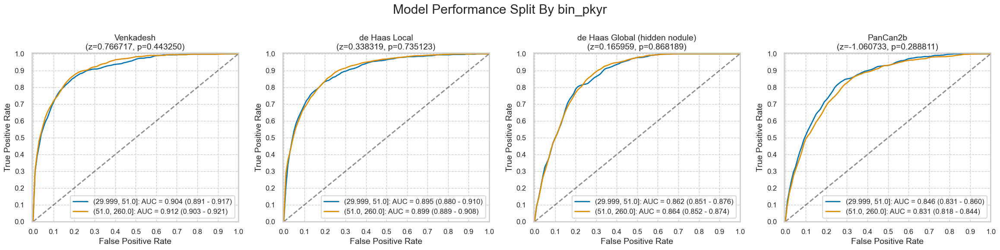

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",8211,51.072961,505,6.150286
"(51.0, 260.0]",7866,48.927039,744,9.458429


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,0.766717,0.338319,0.165959,-1.060733
p,0.443250,0.735123,0.868189,0.288811


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3776529717.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(3.999, 16.0]  8738.0  0.082856  0.275681  0.0  0.0  0.0  0.0  1.0   8738.0   
(16.0, 40.0]   7339.0  0.071536  0.257735  0.0  0.0  0.0  0.0  1.0   7339.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(3.999, 16.0]  14.191577  1.929373   4.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.405369  2.727894  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


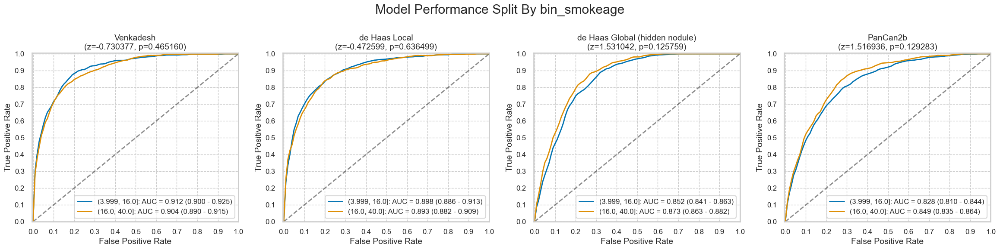

,num,pct,num_mal,pct_mal
"(3.999, 16.0]",8738,54.350936,724,8.285649
"(16.0, 40.0]",7339,45.649064,525,7.153563


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.730377,-0.472599,1.531042,1.516936
p,0.465160,0.636499,0.125759,0.129283


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3776529717.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  8347.0  0.070325  0.255709  0.0  0.0  0.0  0.0  1.0   8347.0   
(25.0, 135.0]   7730.0  0.085640  0.279850  0.0  0.0  0.0  0.0  1.0   7730.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.138493   2.162074  12.0  20.0  20.0  20.0   25.0  
(25.0, 135.0]   37.695860  10.314049  26.0  30.0  35.0  40.0  135.0

#### bin_smokeday

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


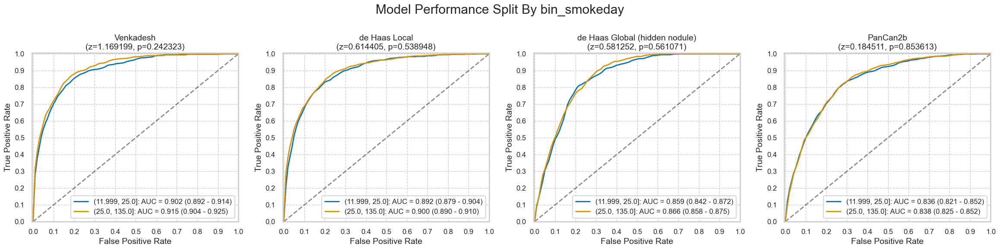

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",8347,51.91889,587,7.032467
"(25.0, 135.0]",7730,48.08111,662,8.564036


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.169199,0.614405,0.581252,0.184511
p,0.242323,0.538948,0.561071,0.853613


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3776529717.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(12.999, 41.0]  8536.0  0.054709  0.227426  0.0  0.0  0.0  0.0  1.0  8536.0   
(41.0, 67.0]    7541.0  0.103700  0.304891  0.0  0.0  0.0  0.0  1.0  7541.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(12.999, 41.0]  35.634372  4.652643  13.0  33.0  37.0  40.0  41.0  
(41.0, 67.0]    47.343058  4.437744  42.0  44.0  46.0  50.0  67.0

#### bin_smokeyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


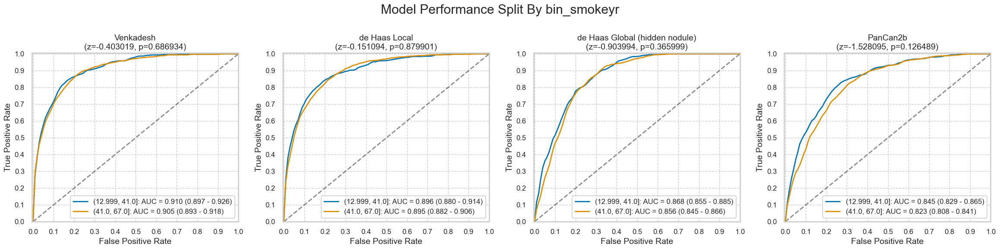

,num,pct,num_mal,pct_mal
"(12.999, 41.0]",8536,53.094483,467,5.470947
"(41.0, 67.0]",7541,46.905517,782,10.369977


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.403019,-0.151094,-0.903994,-1.528095
p,0.686934,0.879901,0.365999,0.126489


In [20]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')
    nlst_preds = nlst_preds.drop(columns=f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,7.484239,4.441719,4.0,4.8,6.0,8.4,69.2
1,1249.0,14.350520,9.007492,4.0,8.6,12.1,17.5,83.0


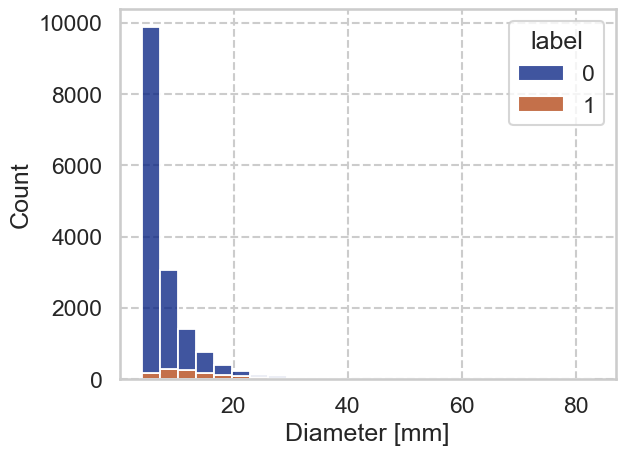

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,2.569463,1.665965,1.0,1.0,2.0,3.0,12.0
1,1249.0,2.383507,1.367931,1.0,1.0,2.0,3.0,11.0


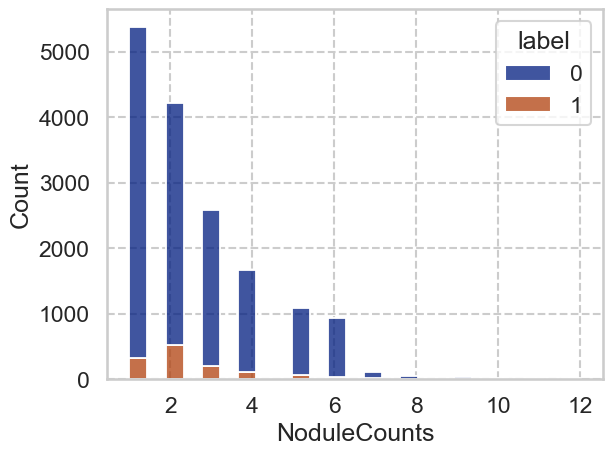

#### CoordX

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,-13.582791,85.402448,-185.47,-84.505,-43.515,69.782500,182.220000
1,1249.0,-10.262150,72.028051,-142.60,-70.970,-36.370,59.865463,136.985016


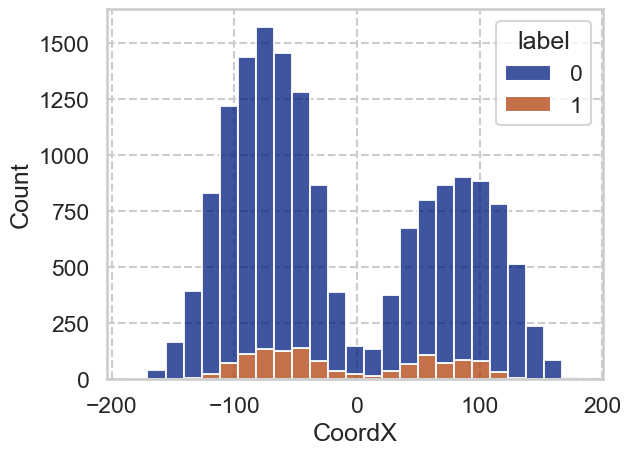

#### CoordY

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,-44.519249,103.645920,-463.29,-123.305,-39.315,41.895000,196.650000
1,1249.0,-23.851371,92.754034,-320.84,-102.650,0.250,45.931229,186.455368


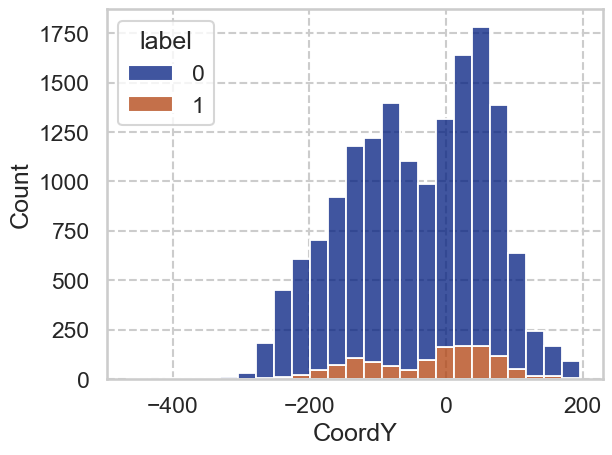

#### CoordZ

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,-2.019645,592.299701,-1624.99,-216.8275,-149.790000,-71.3875,1980.31
1,1249.0,66.357109,595.300960,-1562.52,-165.0800,-111.900002,-53.5900,1920.55


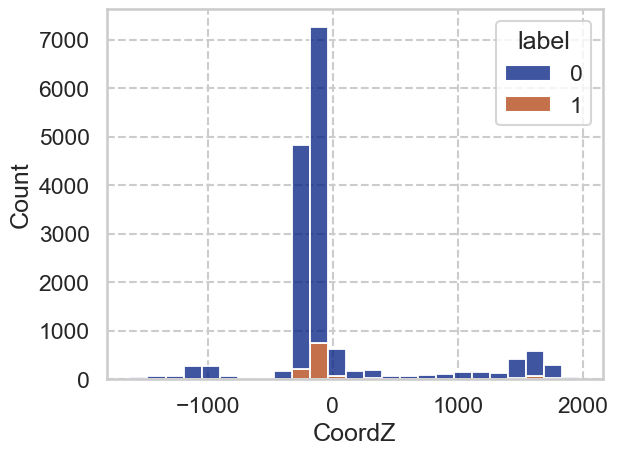

In [21]:
included_num_cols = ["Diameter [mm]", "NoduleCounts", 'CoordX', 'CoordY', 'CoordZ']
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3368910136.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
(3.999, 6.2]       8206.0  0.015476  0.123446  0.0  0.0  0.0  0.0  1.0   
(6.2, 83.0]        7871.0  0.142549  0.349634  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
(3.999, 6.2]             8206.0   4.992603  0.635664  4.0  4.5  4.9   5.5   
(6.2, 83.0]              7871.0  11.171490  6.084835  6.3  7.3  9.2  12.8   

                         
                    max  
bin_Diameter [mm]        
(3.999, 6.2]        6.2  
(6.2, 83.0]        83.0

#### bin_Diameter [mm]

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


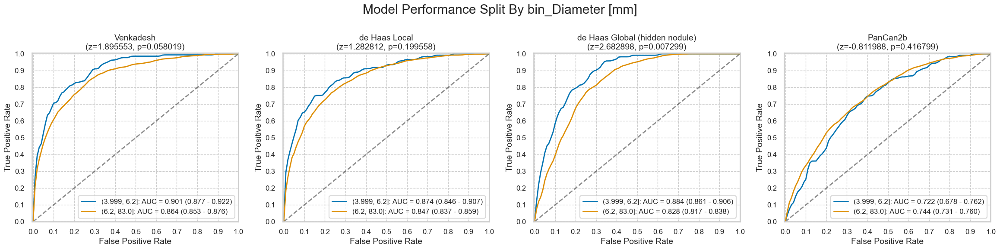

,num,pct,num_mal,pct_mal
"(3.999, 6.2]",8206,51.041861,127,1.547648
"(6.2, 83.0]",7871,48.958139,1122,14.254860


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.895553,1.282812,2.682898,-0.811988
p,0.058019,0.199558,0.007299,0.416799


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3368910136.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_CoordX                                                               
(-185.471, -42.9]  8039.0  0.071775  0.258131  0.0  0.0  0.0  0.0  1.0   
(-42.9, 182.22]    8038.0  0.083603  0.276809  0.0  0.0  0.0  0.0  1.0   

                   CoordX                                                \
                    count       mean        std     min      25%    50%   
bin_CoordX                                                                
(-185.471, -42.9]  8039.0 -85.716669  26.422145 -185.47 -104.130 -83.26   
(-42.9, 182.22]    8038.0  59.076044  55.498238  -42.89   25.485  68.71   

                                     
                        75%     max  
bin_CoordX                           
(-185.471, -42.9]  -64.6000  -42.90  
(-42.9, 182.22]    102.0375  182.22

#### bin_CoordX

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


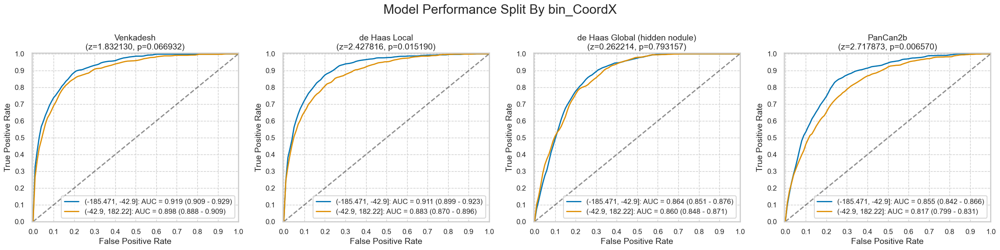

,num,pct,num_mal,pct_mal
"(-185.471, -42.9]",8039,50.00311,577,7.177510
"(-42.9, 182.22]",8038,49.99689,672,8.360289


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,1.832130,2.427816,0.262214,2.717873
p,0.066932,0.015190,0.793157,0.006570


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3368910136.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               \
                     count      mean       std  min  25%  50%  75%  max   
bin_CoordY                                                                
(-463.291, -34.63]  8039.0  0.058216  0.234166  0.0  0.0  0.0  0.0  1.0   
(-34.63, 196.65]    8038.0  0.097163  0.296199  0.0  0.0  0.0  0.0  1.0   

                    CoordY                                                     \
                     count        mean        std     min         25%     50%   
bin_CoordY                                                                      
(-463.291, -34.63]  8039.0 -130.518321  61.629757 -463.29 -172.673125 -121.93   
(-34.63, 196.65]    8038.0   44.702039  45.416856  -34.60   10.189736   42.28   

                                   
                      75%     max  
bin_CoordY                         
(-463.291, -34.63] -80.18  -34.63  
(-34.63, 196.65]    73.13  196.65

#### bin_CoordY

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


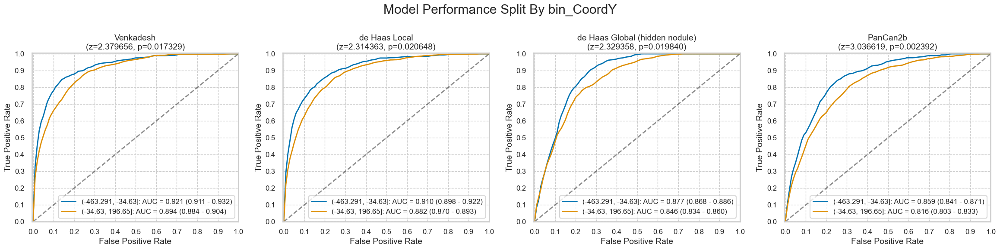

,num,pct,num_mal,pct_mal
"(-463.291, -34.63]",8039,50.00311,468,5.821620
"(-34.63, 196.65]",8038,49.99689,781,9.716347


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,2.379656,2.314363,2.329358,3.036619
p,0.017329,0.020648,0.019840,0.002392


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3368910136.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               \
                       count      mean       std  min  25%  50%  75%  max   
bin_CoordZ                                                                  
(-1624.991, -146.02]  8039.0  0.052618  0.223285  0.0  0.0  0.0  0.0  1.0   
(-146.02, 1980.31]    8038.0  0.102762  0.303667  0.0  0.0  0.0  0.0  1.0   

                      CoordZ                                             \
                       count        mean         std      min       25%   
bin_CoordZ                                                                
(-1624.991, -146.02]  8039.0 -299.411181  271.219958 -1624.99 -259.3700   
(-146.02, 1980.31]    8038.0  306.033741  667.847084  -146.01 -111.4975   

                                                 
                          50%      75%      max  
bin_CoordZ                                       
(-1624.991, -146.02] -213.300 -178.955  -146.02  
(-146.02, 1980.31]    -69.105  527.220  1980.31

#### bin_CoordZ

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


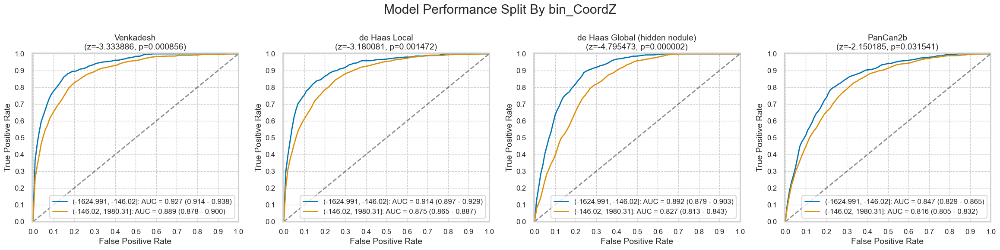

,num,pct,num_mal,pct_mal
"(-1624.991, -146.02]",8039,50.00311,423,5.261848
"(-146.02, 1980.31]",8038,49.99689,826,10.276188


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-3.333886,-3.180081,-4.795473,-2.150185
p,0.000856,0.001472,0.000002,0.031541


C:\Users\shaur\AppData\Local\Temp\ipykernel_17864\3368910136.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                         
(0, 1]             5375.0  0.059535  0.236645  0.0  0.0  0.0  0.0  1.0   
(1, 12]           10702.0  0.086806  0.281564  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                 5375.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]               10702.0  3.336012  1.497645  2.0  2.0  3.0  4.0  12.0

#### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


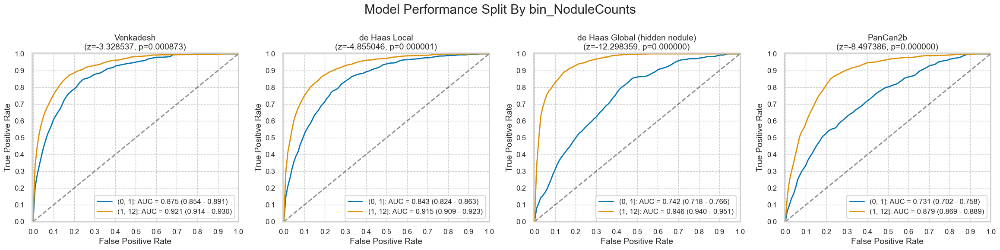

,num,pct,num_mal,pct_mal
"(0, 1]",5375,33.432854,320,5.953488
"(1, 12]",10702,66.567146,929,8.680620


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-3.328537,-4.855046,-1.229836e+01,-8.497386e+00
p,0.000873,0.000001,9.243249e-35,1.939073e-17


In [22]:
for c in included_num_cols:
    if c == 'NoduleCounts': continue
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')
    nlst_preds = nlst_preds.drop(columns=f'bin_{c}')

nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')
nlst_preds = nlst_preds.drop(columns=f'bin_NoduleCounts')

## Further binning categorical columns

In [23]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       14818
2.0   2.0         474
3.0   2.0         222
1.0   1.0         179
6.0   2.0         155
4.0   2.0          64
5.0   2.0          44
6.0   1.0           6
3.0   1.0           4
2.0   1.0           2
4.0   1.0           1
Name: count, dtype: int64

#### NonHispanicWhite

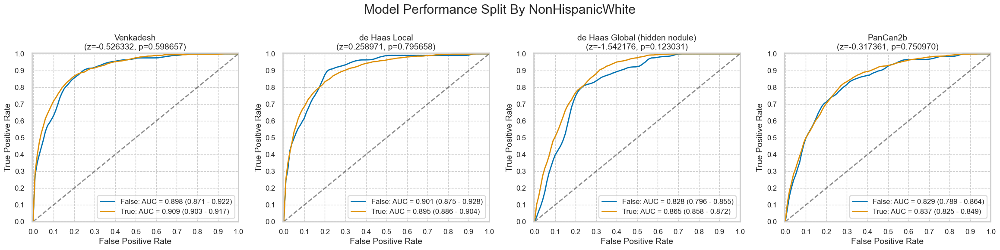

,num,pct,num_mal,pct_mal
False,1259,7.831063,118,9.372518
True,14818,92.168937,1131,7.632609


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.526332,0.258971,-1.542176,-0.317361
p,0.598657,0.795658,0.123031,0.750970


In [24]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

#### HighSchoolPlus

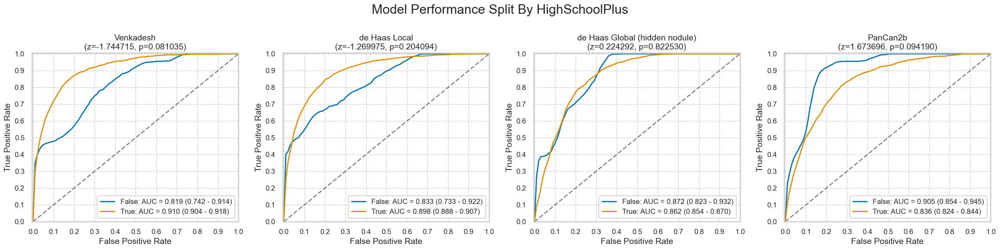

,num,pct,num_mal,pct_mal
False,268,1.666978,24,8.955224
True,15809,98.333022,1225,7.748751


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-1.744715,-1.269975,0.224292,1.673696
p,0.081035,0.204094,0.822530,0.094190


In [25]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

#### Married

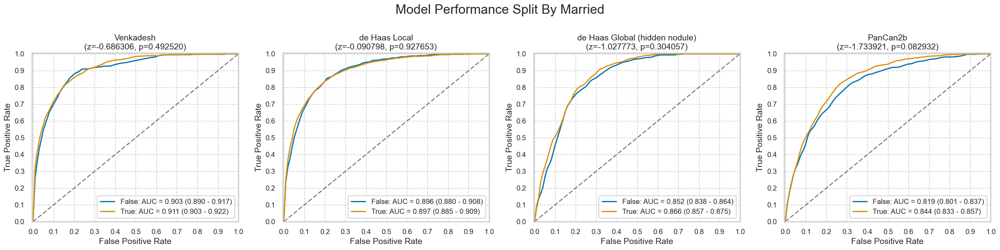

,num,pct,num_mal,pct_mal
False,5179,32.213721,453,8.746862
True,10898,67.786279,796,7.304092


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),PanCan2b
z,-0.686306,-0.090798,-1.027773,-1.733921
p,0.492520,0.927653,0.304057,0.082932


In [26]:
married = (nlst_preds['marital'] == 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')

### Add columns to CSV

In [27]:
# nlst_democols['cat']['demo'].extend(['Married', 'NonHispanicWhite', 'HighSchoolPlus'])
# nlst_democols['cat']['demo']

In [28]:
# nlst_democols['cat']['nodule'] = ["Spiculation", "NoduleType"]
# nlst_democols['num']['nodule'] = ["Diameter [mm]", 'CoordX', 'CoordY', 'CoordZ']
# nlst_democols['cat']['other'] = ["NoduleInUpperLung", "FamilyHistoryLungCa", 'PersonalCancerHist']
# nlst_democols['num']['other'] = ["NoduleCounts"]

In [29]:
# nlst_preds_nodule['BMI'] = nlst_preds_nodule.apply(lambda x: utils.bmi_calc(x['height'], x['weight']), axis=1)
# nlst_preds_nodule['BMI']

0        23.960237
1        22.094286
2        22.094286
3        26.306015
4        26.306015
           ...    
16072    27.115714
16073    27.115714
16074    31.563265
16075    31.563265
16076    31.563265
Name: BMI, Length: 16077, dtype: float64

In [30]:
# nlst_democols['num']['demo'].append('BMI')
# nlst_democols['cat']['other'].append('Emphysema')

In [32]:
# nlst_democols['num']['nodule'].remove('Diameter [mm]')
# nlst_democols['num']['other'].append('Diameter [mm]')

In [33]:
# nlst_democols

In [34]:
# cols_num = sum(nlst_democols['num'].values(), start=[])
# cols_cat = sum(nlst_democols['cat'].values(), start=[])
# cols_list = cols_num + cols_cat + nlst_democols['info']
# cols_list

In [35]:
# nlst_preds_nodule[cols_list].to_csv(f'{NLST_PREDS}/nlst_demo_v3.csv', index=False)

In [36]:
# with open(f'{NLST_PREDS}/nlst_demo_v3_cols.json', 'w') as f:
#     json.dump(nlst_democols, f)

In [37]:
# nlst_preds_nodule.to_csv(f'{NLST_PREDS}/nlst_demov3_allmodels.csv', index=False)

In [38]:
# nlst_preds_nodule.info()